In [3]:
import numpy as np
import pandas as pd

import os
for dirname, _ , filenames in os.walk("C:/Users/suhai/image dataset_maskvsnomask"):
     for filename in filenames:
          print(os.path.join(dirname, filename))

C:/Users/suhai/image dataset_maskvsnomask\mask\does-a-face-mask-protect-me-or-just-the-people-around-studies-show-masks-reduce-infection-risk.webp
C:/Users/suhai/image dataset_maskvsnomask\mask\download.jpeg
C:/Users/suhai/image dataset_maskvsnomask\mask\face-mask-woman-1024x538.webp
C:/Users/suhai/image dataset_maskvsnomask\mask\mask_istock.jpg
C:/Users/suhai/image dataset_maskvsnomask\mask\survey-says-90-indians-aware-but-only-44-wearing-a-mask-discomfort-key-reason-for-non-compliance.webp
C:/Users/suhai/image dataset_maskvsnomask\mask\woman-wearing-mask.original.jpg
C:/Users/suhai/image dataset_maskvsnomask\no mask\download.jpeg
C:/Users/suhai/image dataset_maskvsnomask\no mask\Face-makeup-tips-for-flawless-looking-skin (1).png
C:/Users/suhai/image dataset_maskvsnomask\no mask\GettyImages-1092658864_hero-1024x575.webp
C:/Users/suhai/image dataset_maskvsnomask\no mask\Hair-for-Your-Face-Shape.jpg
C:/Users/suhai/image dataset_maskvsnomask\no mask\The-6-Different-Types-Of-Face-Shapes.j

In [4]:
import cv2
import glob
import os

In [6]:
inputFolder = "C:/Users/suhai/image dataset_maskvsnomask/mask"
folderLen = len(inputFolder)
for img in glob.glob(inputFolder + "/*.*"):
    image = cv2.imread(img)
    imgResized=cv2.resize(image,(150,150))
    cv2.imwrite("C:/VScode universe/output_mas_nomask/mask"+img[folderLen:],imgResized)

In [7]:
inputFolder = "C:/Users/suhai/image dataset_maskvsnomask/no mask"
folderLen = len(inputFolder)
for img in glob.glob(inputFolder + "/*.*"):
    image = cv2.imread(img)
    imgResized = cv2.resize(image,(150,150))
    cv2.imwrite("C:/VScode universe/output_mas_nomask/nomask"+img[folderLen:],imgResized)

In [8]:
import tensorflow as tf
import numpy as np
from keras.preprocessing.image import ImageDataGenerator


In [9]:
train_data = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
training_set = train_data.flow_from_directory("C:/VScode universe/output_mas_nomask", batch_size= 5, target_size=(150,150), class_mode='binary')


Found 7 images belonging to 2 classes.


In [13]:
cnn = tf.keras.models.Sequential()

In [18]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, input_shape=[150, 150, 3], activation='relu'))


In [20]:
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides = 2))

In [22]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation = 'relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size= 2, strides = 2))


In [23]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation = 'relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size= 2, strides = 2))


In [24]:
cnn.add(tf.keras.layers.Flatten())

In [25]:
cnn.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

In [26]:
cnn.compile(optimizer='adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [27]:
cnn.fit(x=training_set , epochs = 25)

Epoch 1/25
2/2 [==============================] - 2s 87ms/step - loss: 0.7080 - accuracy: 0.2857
Epoch 2/25
2/2 [==============================] - 0s 39ms/step - loss: 0.6871 - accuracy: 0.5714
Epoch 3/25
2/2 [==============================] - 0s 48ms/step - loss: 0.6329 - accuracy: 0.7143
Epoch 4/25
2/2 [==============================] - 0s 87ms/step - loss: 0.6140 - accuracy: 0.7143
Epoch 5/25
2/2 [==============================] - 0s 40ms/step - loss: 0.5409 - accuracy: 0.8571
Epoch 6/25
2/2 [==============================] - 0s 98ms/step - loss: 0.5074 - accuracy: 0.7143
Epoch 7/25
2/2 [==============================] - 0s 39ms/step - loss: 0.3690 - accuracy: 1.0000
Epoch 8/25
2/2 [==============================] - 0s 90ms/step - loss: 0.4455 - accuracy: 0.8571
Epoch 9/25
2/2 [==============================] - 0s 43ms/step - loss: 0.4352 - accuracy: 0.7143
Epoch 10/25
2/2 [==============================] - 0s 43ms/step - loss: 0.3122 - accuracy: 1.0000
Epoch 11/25
2/2 [============

In [28]:
cnn.save('facemask_cnn_model.h5')

c:\Users\suhai\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [29]:
import numpy as np
from keras.preprocessing import image
training_set.class_indices


{'mask': 0, 'nomask': 1}

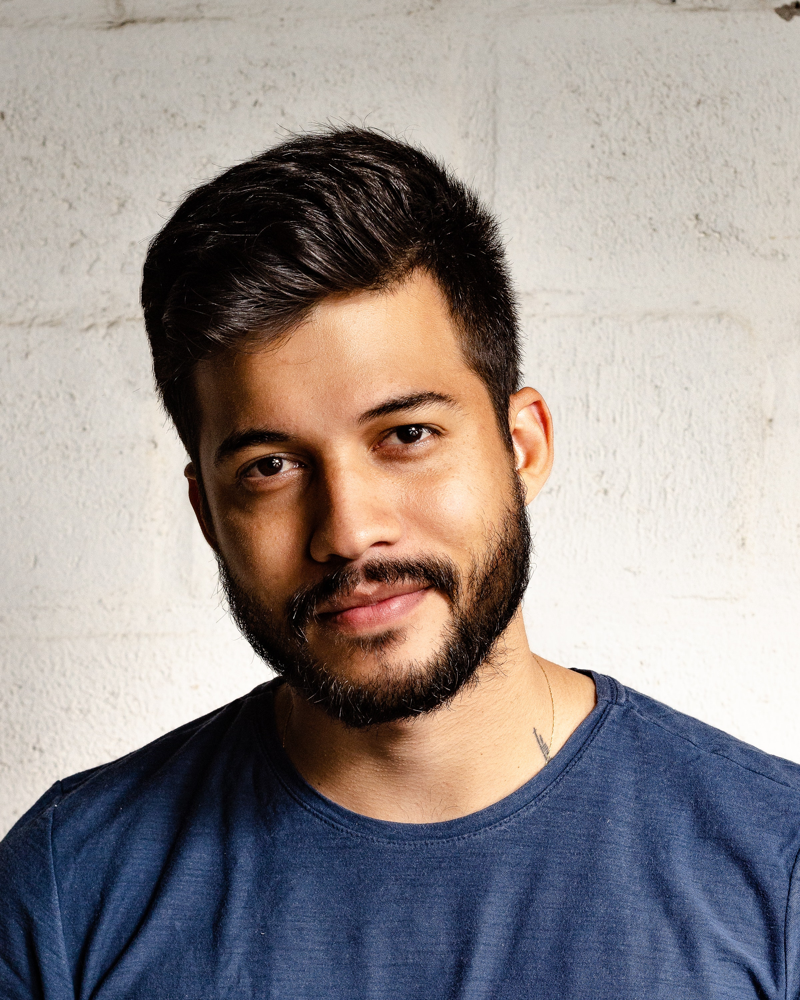

In [40]:
image.load_img("C:/Users/suhai/Downloads/pexels-italo-melo-2379005.jpg")

In [42]:
model_path = 'facemask_cnn_model.h5'
model = tf.keras.models.load_model(model_path)

test_img = image.load_img("C:/Users/suhai/Downloads/pexels-italo-melo-2379005.jpg", target_size=(150, 150))
test_img = image.img_to_array(test_img)
test_img = np.expand_dims(test_img, axis=0)

result = model.predict(test_img)

if result[0][0] >= 0.5:
    prediction = 'Picture without mask'
else:
    prediction = 'Picture with mask'
print(prediction)

1/1 [==============================] - 0s 109ms/step
Picture with mask
